# Stage 01 — Watermark Detection
Multi-model consensus detection (YOLOv11 + corzent)

**Input:** `INPUT_FOLDER` altındaki tüm videolar (alt klasörler dahil)

**Output:** `OUTPUT_FOLDER/results.json`

> JSON'daki `videos` dict'inin **key'i** videonun `INPUT_FOLDER`'a göre **göreli yoludur**
> (örn. `"subfolder/video.mp4"`). Sonraki stage'ler bu yapıyı aynen korur.


## 1) Config

In [1]:
# ============================================================
# PIPELINE CONFIG
# ============================================================

INPUT_FOLDER  = "/content/drive/MyDrive/Watermark-Input"
OUTPUT_FOLDER = "/content/drive/MyDrive/Watermark-Output"

VIDEO_EXTENSIONS = (".mp4", ".avi", ".mov", ".mkv", ".webm")

# ============================================================
# DETECTION CONFIG
# ============================================================

FRAME_SAMPLE_RATE   = 20
MAX_FRAMES_PER_VIDEO = 20

CONFIDENCE_THRESHOLD = 0.15
IOU_THRESHOLD        = 0.45
IMG_SIZE             = 640

CLUSTER_IOU_THRESHOLD    = 0.3
W_COVERAGE               = 0.7
W_CONFIDENCE             = 0.3
MIN_CONSENSUS_THRESHOLD  = 0.15

# --- Ana karar esigi ---
# Bu deger altinda kalan tespitler CLEAN sayilir.
# 0.10 = %10 confidence ustu watermark kabul edilir
FINAL_THRESHOLD = 0.10

BBOX_MIN_AREA      = 500
BBOX_MAX_AREA_RATIO = 0.4

print(f"Input folder : {INPUT_FOLDER}")
print(f"Output folder: {OUTPUT_FOLDER}")
print(f"Final threshold: {FINAL_THRESHOLD} (%{int(FINAL_THRESHOLD*100)})")


Pipeline root : /content/drive/MyDrive/pipeline
Final threshold: 0.1 (%10)


## 2) Setup

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
!pip install -q ultralytics huggingface_hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 83.7 MB/s eta 0:00:00


In [4]:
import gc
import json
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from huggingface_hub import hf_hub_download
from ultralytics import YOLO

# Pipeline klasorlerini olustur
input_folder  = Path(INPUT_FOLDER)
output_folder = Path(OUTPUT_FOLDER)
output_folder.mkdir(parents=True, exist_ok=True)

# Videolari bul — alt klasorler dahil (rglob ile ozyinelemeli)
video_files = sorted([
    f for f in input_folder.rglob("*")
    if f.is_file() and f.suffix.lower() in VIDEO_EXTENSIONS
])

print(f"Bulunan video: {len(video_files)}")
for v in video_files:
    rel = v.relative_to(input_folder)
    print(f"  -> {rel}")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Bulunan video: 13
  -> 222ca07b-a4fc-4aaf-83e2-5c21d4a53d30_audio.mp4
  -> 280777ce-b721-4732-a181-d24edc6312f8_audio_audio.mp4
  -> 29c6cdb5-44b2-436f-9924-c35727e1d41a_audio.mp4
  -> 2cd17ffe-ad09-4886-b633-217b134fbd7e_audio.mp4
  -> 40ded463-ca7c-488e-80d5-4f3941ddfabc_audio_audio.mp4
  -> 6e354a1e-d45f-4ee2-83a2-2e3c48b65930_audio.mp4
  -> 9c15e55a-6f1f-4e83-b190-e46ff9c19a67_audio_audio.mp4
  -> a8863b55-a03b-4ebd-b76f-6374b5e0faaa_audio.mp4
  -> add383bc-c101-4ca5-898d-29fd41873cd1_audio_audio.mp4
  -> e25b4a39-b5a9-4a70-91fc-30e6969a14ae_audio.mp4
  -> eaff0510-c67e-4953-a37b-5bc3f8e3db64_audio.mp4
  -> f7741182-66a2-4d5b-9ffe-2b906009afba_audio_audio.mp4
  -> f7c039e7-afe

## 3) Model Yukleme

In [5]:
print("YOLOv11 indiriliyor...")
yolov11_path = hf_hub_download(
    repo_id="fancyfeast/joycaption-watermark-detection",
    filename="yolo11x-train28-best.pt",
    repo_type="space"
)
model_yolov11 = YOLO(yolov11_path)
print("YOLOv11 OK")

print("corzent/yolo11x indiriliyor...")
corzent_path = hf_hub_download(
    repo_id="corzent/yolo11x_watermark_detection",
    filename="best.pt"
)
model_corzent = YOLO(corzent_path)
print("corzent OK")

YOLOv11 indiriliyor...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


yolo11x-train28-best.pt:   0%|          | 0.00/115M [00:00<?, ?B/s]

YOLOv11 OK
corzent/yolo11x indiriliyor...


best.pt:   0%|          | 0.00/114M [00:00<?, ?B/s]

corzent OK


## 4) Fonksiyonlar

In [6]:
def sample_frames(video_path, max_frames, sample_rate):
    cap = cv2.VideoCapture(str(video_path))
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    indices = list(range(0, total, sample_rate))[:max_frames]
    frames = []
    for idx in indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
        ret, frame = cap.read()
        if ret:
            frames.append((idx, frame))
    cap.release()
    return frames, fps, total


def detect_yolo(model, frame):
    results = model.predict(
        frame, conf=CONFIDENCE_THRESHOLD, iou=IOU_THRESHOLD,
        imgsz=IMG_SIZE, verbose=False
    )
    bboxes = []
    h, w = frame.shape[:2]
    max_area = w * h * BBOX_MAX_AREA_RATIO
    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
            conf = float(box.conf[0])
            area = (x2 - x1) * (y2 - y1)
            if area < BBOX_MIN_AREA or area > max_area:
                continue
            bboxes.append({"bbox": (x1, y1, x2, y2), "conf": conf})
    return bboxes


def compute_iou(a, b):
    xa, ya = max(a[0], b[0]), max(a[1], b[1])
    xb, yb = min(a[2], b[2]), min(a[3], b[3])
    inter = max(0, xb - xa) * max(0, yb - ya)
    union = (a[2]-a[0])*(a[3]-a[1]) + (b[2]-b[0])*(b[3]-b[1]) - inter
    return inter / union if union > 0 else 0


def cluster_and_score(all_detections, total_frames):
    if not all_detections:
        return []
    clusters = []
    for frame_id, det in all_detections:
        bbox, conf = det["bbox"], det["conf"]
        matched = False
        for c in clusters:
            if compute_iou(bbox, c["avg_bbox"]) > CLUSTER_IOU_THRESHOLD:
                c["bboxes"].append(bbox)
                c["frame_ids"].add(frame_id)
                c["confs"].append(conf)
                bs = c["bboxes"]
                c["avg_bbox"] = (
                    min([b[0] for b in bs]),
                    min([b[1] for b in bs]),
                    max([b[2] for b in bs]),
                    max([b[3] for b in bs])
                )
                matched = True
                break
        if not matched:
            clusters.append({
                "bboxes": [bbox], "frame_ids": {frame_id},
                "confs": [conf], "avg_bbox": bbox
            })
    results = []
    for c in clusters:
        fc = len(c["frame_ids"])
        cov = fc / total_frames
        ac = np.mean(c["confs"])
        score = (cov ** W_COVERAGE) * (ac ** W_CONFIDENCE)
        if score < MIN_CONSENSUS_THRESHOLD:
            continue
        results.append({
            "bbox": c["avg_bbox"], "score": score,
            "frame_count": fc, "total_frames": total_frames, "avg_conf": ac
        })
    results.sort(key=lambda x: x["score"], reverse=True)
    return results


def merge_overlapping_boxes(results):
    """Ortusenleri tek buyuk dikdortgene birlestirir.
    Ortusmeyen kutulara dokunmaz. Zincirleme kontrol yapar."""
    if len(results) <= 1:
        return results

    def boxes_overlap(a, b):
        xa = max(a[0], b[0])
        ya = max(a[1], b[1])
        xb = min(a[2], b[2])
        yb = min(a[3], b[3])
        return (xb > xa) and (yb > ya)

    def merge_two(r1, r2):
        b1, b2 = r1["bbox"], r2["bbox"]
        merged_bbox = (
            min(b1[0], b2[0]), min(b1[1], b2[1]),
            max(b1[2], b2[2]), max(b1[3], b2[3])
        )
        return {
            "bbox": merged_bbox,
            "score": max(r1["score"], r2["score"]),
            "avg_conf": max(r1["avg_conf"], r2["avg_conf"]),
            "frame_count": max(r1["frame_count"], r2["frame_count"]),
            "total_frames": r1["total_frames"]
        }

    # Zincirleme: birlesme olmayana kadar tekrarla
    merged = list(results)
    changed = True
    while changed:
        changed = False
        new_list = []
        used = [False] * len(merged)
        for i in range(len(merged)):
            if used[i]:
                continue
            current = merged[i]
            for j in range(i + 1, len(merged)):
                if used[j]:
                    continue
                if boxes_overlap(current["bbox"], merged[j]["bbox"]):
                    current = merge_two(current, merged[j])
                    used[j] = True
                    changed = True
            new_list.append(current)
        merged = new_list

    merged.sort(key=lambda x: x["score"], reverse=True)
    return merged


def draw_consensus(frame, consensus_list, label, color):
    vis = frame.copy()
    for res in consensus_list:
        x1, y1, x2, y2 = res["bbox"]
        pct = int(res["score"] * 100)
        fc, tf = res["frame_count"], res["total_frames"]
        cv2.rectangle(vis, (x1, y1), (x2, y2), color, 3)
        txt = f"{label} %{pct} ({fc}/{tf}f)"
        (lw, lh), _ = cv2.getTextSize(txt, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
        cv2.rectangle(vis, (x1, y1 - lh - 10), (x1 + lw + 4, y1), color, -1)
        cv2.putText(vis, txt, (x1 + 2, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)
    return vis


print("Fonksiyonlar hazir.")

Fonksiyonlar hazir.


## 5) Ana Dongu (Detection)

In [7]:
all_results = {}   # relative_path -> detection data (JSON icin)
gallery = []       # (vname, frame, cons_v11, cons_corzent, cons_final) gorsel icin

for video_path in video_files:
    # Goreli yol: alt klasor yapısını korur (orn. 'subfolder/video.mp4')
    rel_path = video_path.relative_to(input_folder)
    vname    = str(rel_path)          # JSON key ve log etiketi

    print(f"\n{'='*60}")
    print(f"Video: {vname}")
    print(f"{'='*60}")

    frames, fps, total_frames = sample_frames(
        video_path, MAX_FRAMES_PER_VIDEO, FRAME_SAMPLE_RATE
    )
    n_sampled = len(frames)
    print(f"  Toplam: {total_frames} frame | FPS: {fps:.1f} | Orneklenen: {n_sampled}")

    if not frames:
        print("  Frame okunamadi, atlaniyor.")
        all_results[vname] = {"status": "ERROR", "regions": []}
        continue

    # Her frame icin iki modeli calistir
    all_det_v11     = []
    all_det_corzent = []

    for frame_id, frame in frames:
        v11 = detect_yolo(model_yolov11, frame)
        cor = detect_yolo(model_corzent, frame)
        for det in v11:
            all_det_v11.append((frame_id, det))
        for det in cor:
            all_det_corzent.append((frame_id, det))

    # Consensus
    cons_v11     = cluster_and_score(all_det_v11, n_sampled)
    cons_corzent = cluster_and_score(all_det_corzent, n_sampled)
    cons_or      = cluster_and_score(all_det_v11 + all_det_corzent, n_sampled)
    cons_final   = [r for r in cons_or if r["score"] >= FINAL_THRESHOLD]
    cons_final   = merge_overlapping_boxes(cons_final)

    # Karar
    status = "WATERMARKED" if cons_final else "CLEAN"
    print(f"  -> {status} ({len(cons_final)} bolge bulundu)")

    # JSON icin kaydet
    all_results[vname] = {
        "status":        status,
        "relative_path": vname,              # alt klasor yapisi icin
        "source_path":   str(video_path),    # tam mutlak yol (okuma icin)
        "total_frames":  total_frames,
        "sampled_frames": n_sampled,
        "fps":           round(fps, 2),
        "regions": [
            {
                "bbox":        list(r["bbox"]),
                "score":       round(r["score"], 4),
                "avg_conf":    round(r["avg_conf"], 4),
                "frame_count": r["frame_count"],
                "total_frames": r["total_frames"]
            }
            for r in cons_final
        ]
    }

    # Gorsel icin sakla
    display_frame = frames[len(frames) // 2][1]
    gallery.append((vname, display_frame.copy(), cons_v11, cons_corzent, cons_final))

    del frames
    gc.collect()
    torch.cuda.empty_cache()

print(f"\nTum videolar islendi. ({len(all_results)} video)")



Video: 222ca07b-a4fc-4aaf-83e2-5c21d4a53d30_audio.mp4
  Toplam: 197 frame | FPS: 40.0 | Orneklenen: 10
  -> WATERMARKED (2 bolge bulundu)

Video: 280777ce-b721-4732-a181-d24edc6312f8_audio_audio.mp4
  Toplam: 197 frame | FPS: 40.0 | Orneklenen: 10
  -> WATERMARKED (2 bolge bulundu)

Video: 29c6cdb5-44b2-436f-9924-c35727e1d41a_audio.mp4
  Toplam: 157 frame | FPS: 40.0 | Orneklenen: 8
  -> WATERMARKED (2 bolge bulundu)

Video: 2cd17ffe-ad09-4886-b633-217b134fbd7e_audio.mp4
  Toplam: 189 frame | FPS: 40.0 | Orneklenen: 10
  -> WATERMARKED (2 bolge bulundu)

Video: 40ded463-ca7c-488e-80d5-4f3941ddfabc_audio_audio.mp4
  Toplam: 157 frame | FPS: 40.0 | Orneklenen: 8
  -> WATERMARKED (6 bolge bulundu)

Video: 6e354a1e-d45f-4ee2-83a2-2e3c48b65930_audio.mp4
  Toplam: 358 frame | FPS: 40.0 | Orneklenen: 18
  -> WATERMARKED (1 bolge bulundu)

Video: 9c15e55a-6f1f-4e83-b190-e46ff9c19a67_audio_audio.mp4
  Toplam: 197 frame | FPS: 40.0 | Orneklenen: 10
  -> WATERMARKED (2 bolge bulundu)

Video: a88

## 6) Sonuc Gorseli
Her video icin 3 sutun: **YOLOv11** | **corzent** | **FINAL karar**

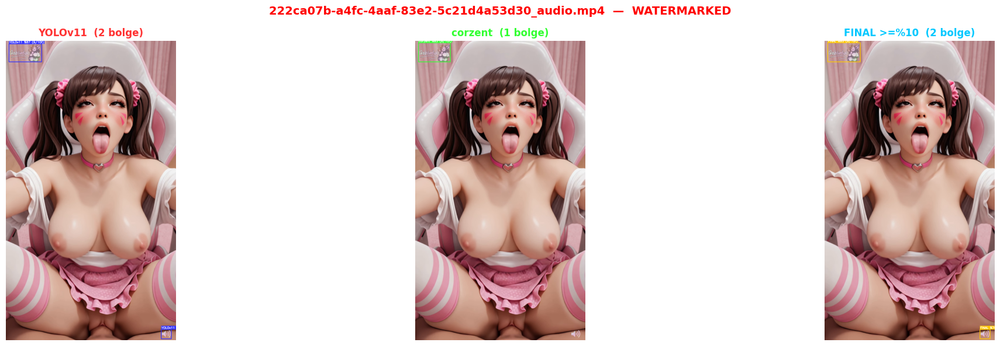

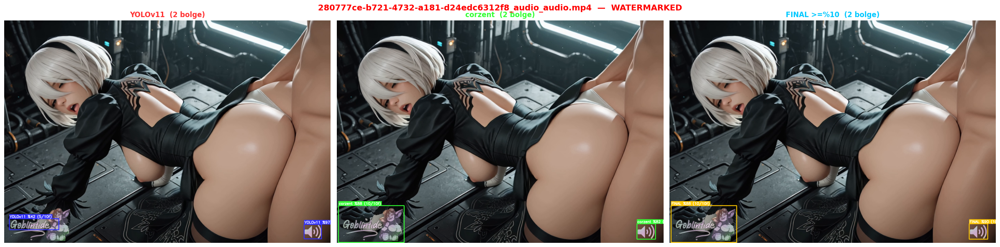

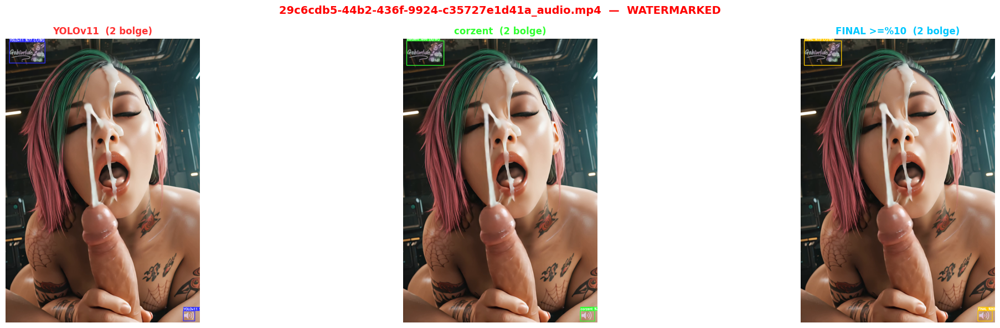

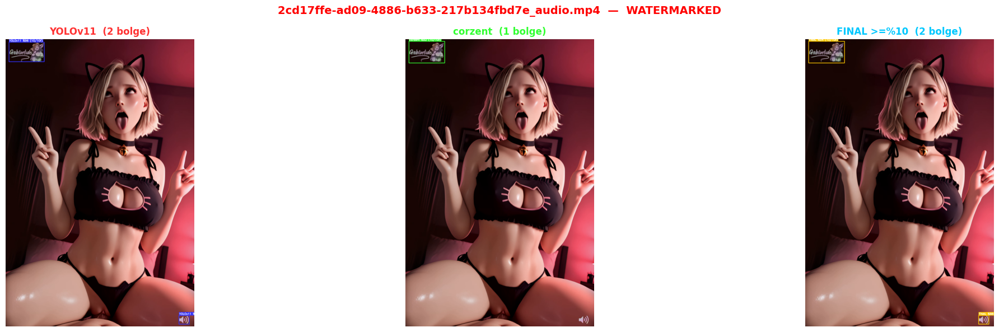

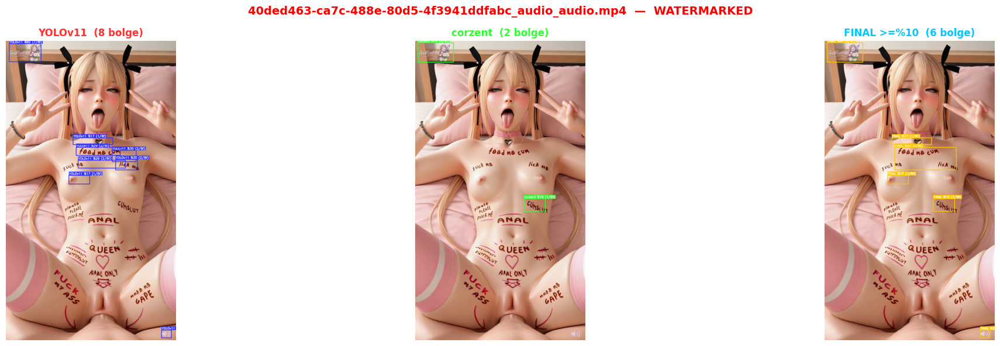

...

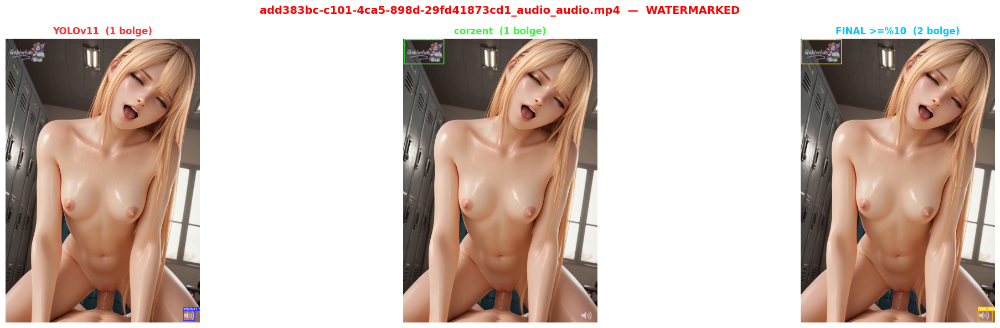

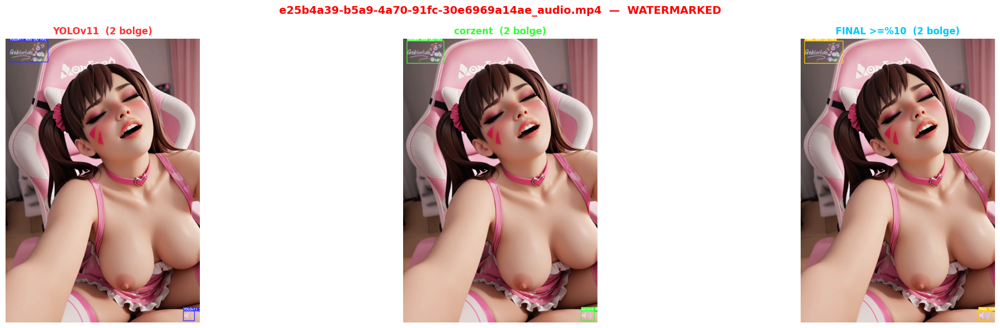

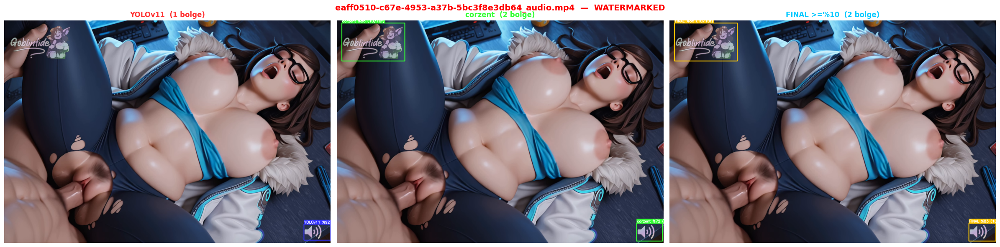

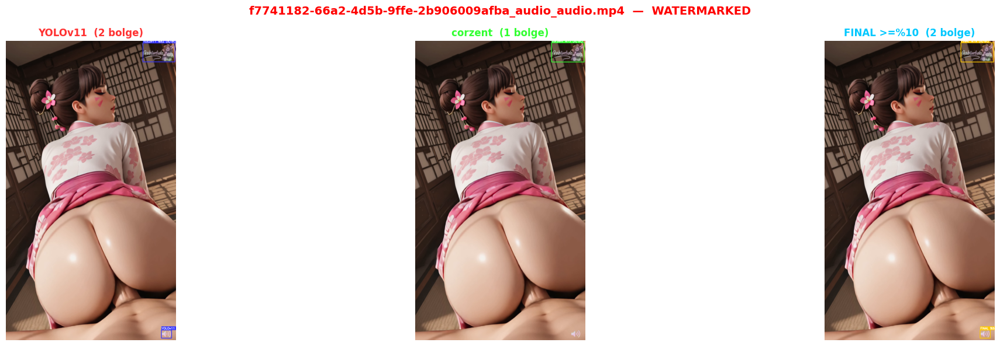

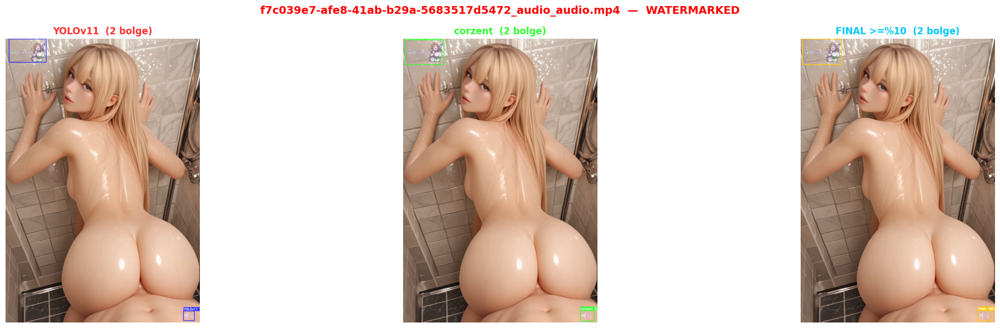

Gorseller tamamlandi.


In [8]:
COLOR_V11    = (255, 50, 50)
COLOR_COR    = (50, 255, 50)
COLOR_FINAL  = (0, 200, 255)

for vname, frame, cons_v11, cons_corzent, cons_final in gallery:
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))

    status = "WATERMARKED" if cons_final else "CLEAN"
    fig.suptitle(f"{vname}  —  {status}", fontsize=14, fontweight="bold",
                 color="red" if cons_final else "green")

    # Col 1: YOLOv11
    vis1 = draw_consensus(frame, cons_v11, "YOLOv11", COLOR_V11)
    axes[0].imshow(cv2.cvtColor(vis1, cv2.COLOR_BGR2RGB))
    n1 = len(cons_v11)
    axes[0].set_title(f"YOLOv11  ({n1} bolge)",
                      color=np.array(COLOR_V11)/255, fontweight="bold", fontsize=12)
    axes[0].axis("off")

    # Col 2: corzent
    vis2 = draw_consensus(frame, cons_corzent, "corzent", COLOR_COR)
    axes[1].imshow(cv2.cvtColor(vis2, cv2.COLOR_BGR2RGB))
    n2 = len(cons_corzent)
    axes[1].set_title(f"corzent  ({n2} bolge)",
                      color=np.array(COLOR_COR)/255, fontweight="bold", fontsize=12)
    axes[1].axis("off")

    # Col 3: FINAL
    vis3 = draw_consensus(frame, cons_final, "FINAL", COLOR_FINAL)
    axes[2].imshow(cv2.cvtColor(vis3, cv2.COLOR_BGR2RGB))
    n3 = len(cons_final)
    axes[2].set_title(f"FINAL >=%{int(FINAL_THRESHOLD*100)}  ({n3} bolge)",
                      color=np.array(COLOR_FINAL)/255, fontweight="bold", fontsize=12)
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()
    plt.close(fig)

print("Gorseller tamamlandi.")

## 7) Ozet Tablo

In [9]:
wm_count = sum(1 for v in all_results.values() if v["status"] == "WATERMARKED")
cl_count = sum(1 for v in all_results.values() if v["status"] == "CLEAN")

print(f"{'Video':<35} {'Durum':<14} {'Bolge':>6} {'Skor':>8}")
print("-" * 67)
for vname, data in all_results.items():
    n = len(data["regions"])
    top = f"%{int(data['regions'][0]['score']*100)}" if n > 0 else "-"
    print(f"{vname:<35} {data['status']:<14} {n:>6} {top:>8}")
print("-" * 67)
print(f"\nToplam: {len(all_results)} video | {wm_count} WATERMARKED | {cl_count} CLEAN")
print(f"Threshold: >=%{int(FINAL_THRESHOLD*100)}")

Video                               Durum           Bolge     Skor
-------------------------------------------------------------------
222ca07b-a4fc-4aaf-83e2-5c21d4a53d30_audio.mp4 WATERMARKED         2      %85
280777ce-b721-4732-a181-d24edc6312f8_audio_audio.mp4 WATERMARKED         2      %90
29c6cdb5-44b2-436f-9924-c35727e1d41a_audio.mp4 WATERMARKED         2      %80
2cd17ffe-ad09-4886-b633-217b134fbd7e_audio.mp4 WATERMARKED         2      %94
40ded463-ca7c-488e-80d5-4f3941ddfabc_audio_audio.mp4 WATERMARKED         6      %84
6e354a1e-d45f-4ee2-83a2-2e3c48b65930_audio.mp4 WATERMARKED         1      %80
9c15e55a-6f1f-4e83-b190-e46ff9c19a67_audio_audio.mp4 WATERMARKED         2      %86
a8863b55-a03b-4ebd-b76f-6374b5e0faaa_audio.mp4 WATERMARKED         2      %83
add383bc-c101-4ca5-898d-29fd41873cd1_audio_audio.mp4 WATERMARKED         2      %87
e25b4a39-b5a9-4a70-91fc-30e6969a14ae_audio.mp4 WATERMARKED         2      %85
eaff0510-c67e-4953-a37b-5bc3f8e3db64_audio.mp4 WATERMARKED   

## 8) JSON Ciktisi (Pipeline)

In [10]:
output_path = output_folder / "results.json"

output_data = {
    "config": {
        "input_folder":          INPUT_FOLDER,   # downstream stage'ler icin
        "output_folder":         OUTPUT_FOLDER,
        "final_threshold":       FINAL_THRESHOLD,
        "confidence_threshold":  CONFIDENCE_THRESHOLD,
        "iou_threshold":         IOU_THRESHOLD,
        "frame_sample_rate":     FRAME_SAMPLE_RATE,
        "max_frames_per_video":  MAX_FRAMES_PER_VIDEO
    },
    # key = relative_path (orn. 'subfolder/video.mp4')
    # Her entry'de 'relative_path' ve 'source_path' field'lari da mevcut.
    "videos": all_results
}

with open(output_path, "w", encoding="utf-8") as f:
    json.dump(output_data, f, indent=2, ensure_ascii=False)

print(f"Sonuclar kaydedildi : {output_path}")
print(f"Toplam video        : {len(all_results)}")
print(f"Sonraki stage bu dosyayi okuyarak devam edebilir.")


Sonuclar kaydedildi: /content/drive/MyDrive/pipeline/watermark_detected/results.json
Sonraki stage bu dosyayi okuyarak devam edebilir.


## 9) Dogrulama (Drive'dan okuma testi)
Detection sonuclarina bagli degil, sadece **Config hucresini** calistirdiktan sonra calistirilabilir.

Drive'a yazilmis JSON'u okuyup gorsellestir — removal notebook'u da ayni islemi yapacak.

JSON okundu: /content/drive/MyDrive/pipeline/watermark_detected/results.json
Config: {'final_threshold': 0.1, 'confidence_threshold': 0.15, 'iou_threshold': 0.45, 'frame_sample_rate': 20, 'max_frames_per_video': 20}
Video sayisi: 13

222ca07b-a4fc-4aaf-83e2-5c21d4a53d30_audio.mp4: WATERMARKED (2 bolge)


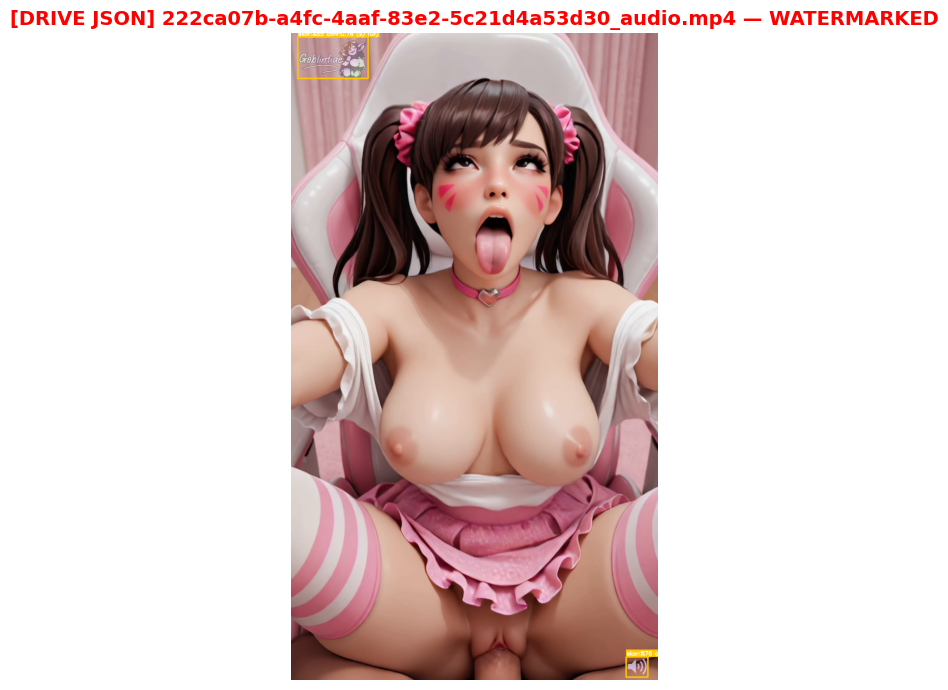

280777ce-b721-4732-a181-d24edc6312f8_audio_audio.mp4: WATERMARKED (2 bolge)


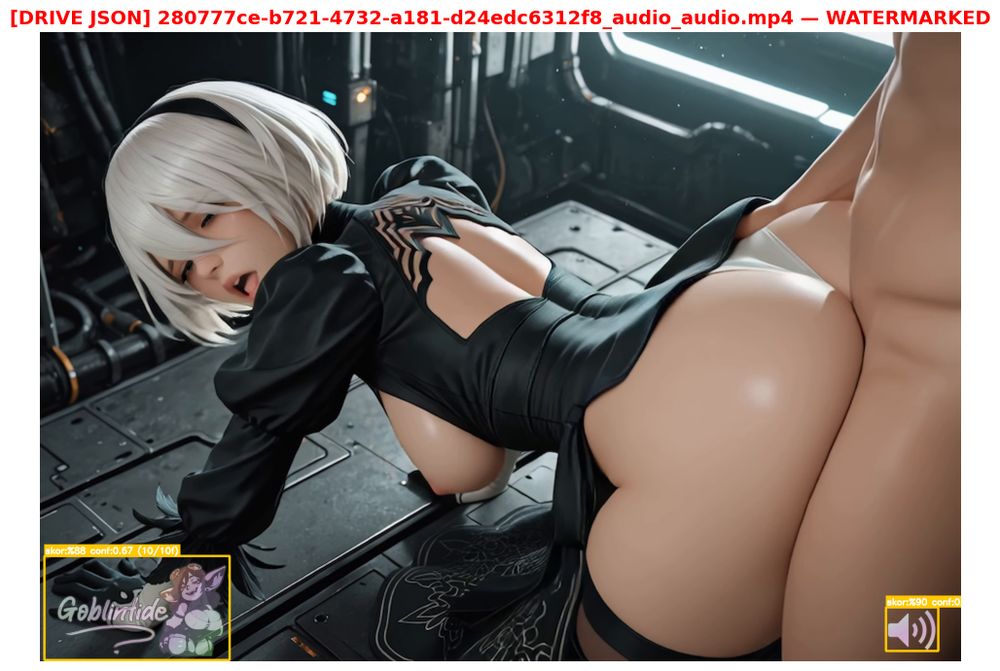

29c6cdb5-44b2-436f-9924-c35727e1d41a_audio.mp4: WATERMARKED (2 bolge)


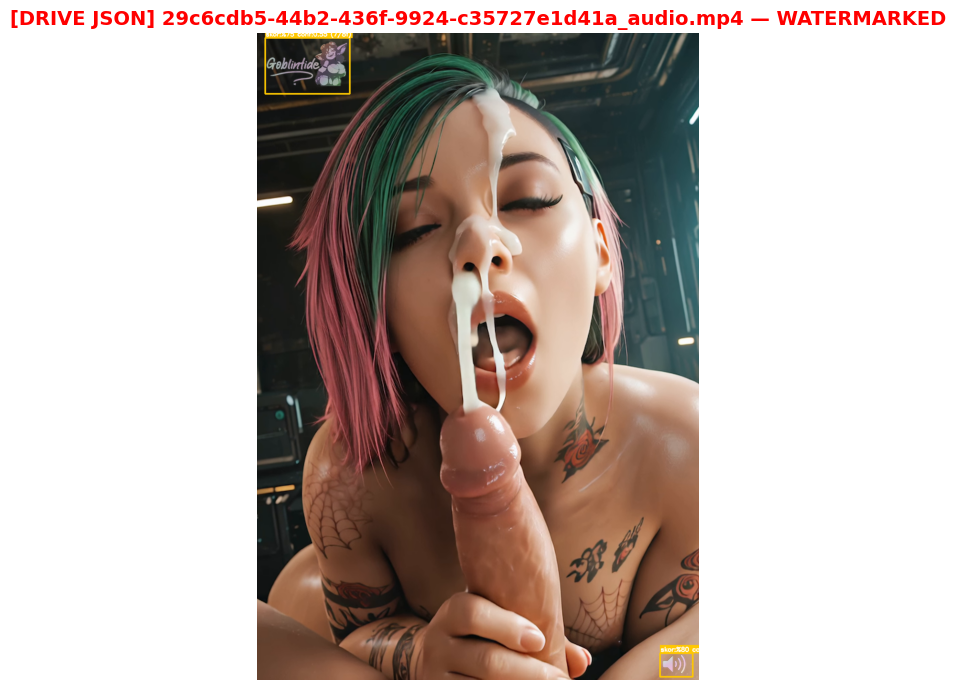

2cd17ffe-ad09-4886-b633-217b134fbd7e_audio.mp4: WATERMARKED (2 bolge)


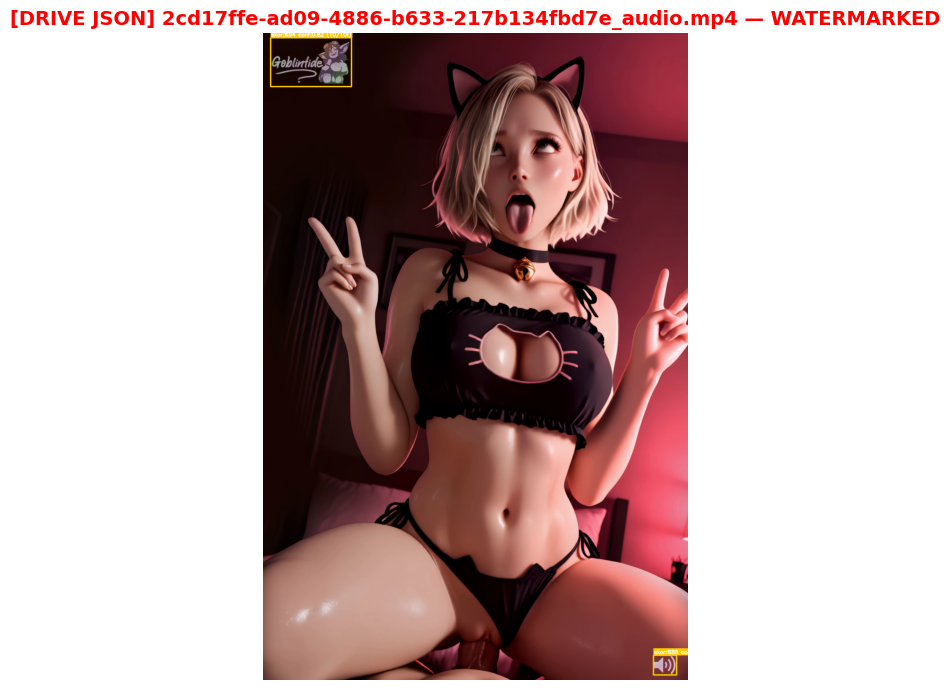

40ded463-ca7c-488e-80d5-4f3941ddfabc_audio_audio.mp4: WATERMARKED (6 bolge)


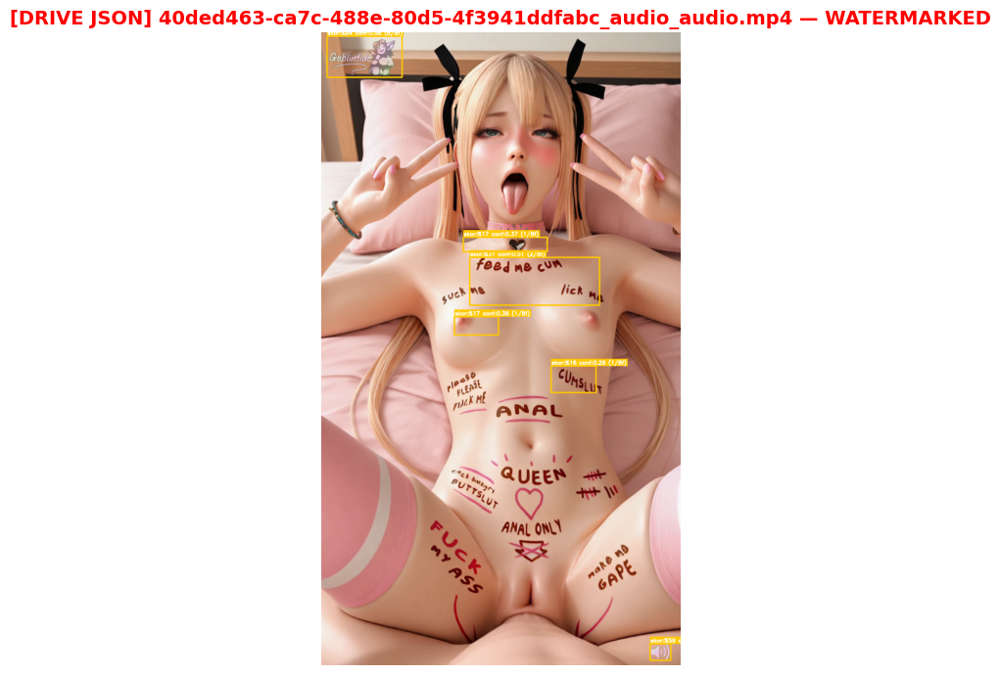

6e354a1e-d45f-4ee2-83a2-2e3c48b65930_audio.mp4: WATERMARKED (1 bolge)


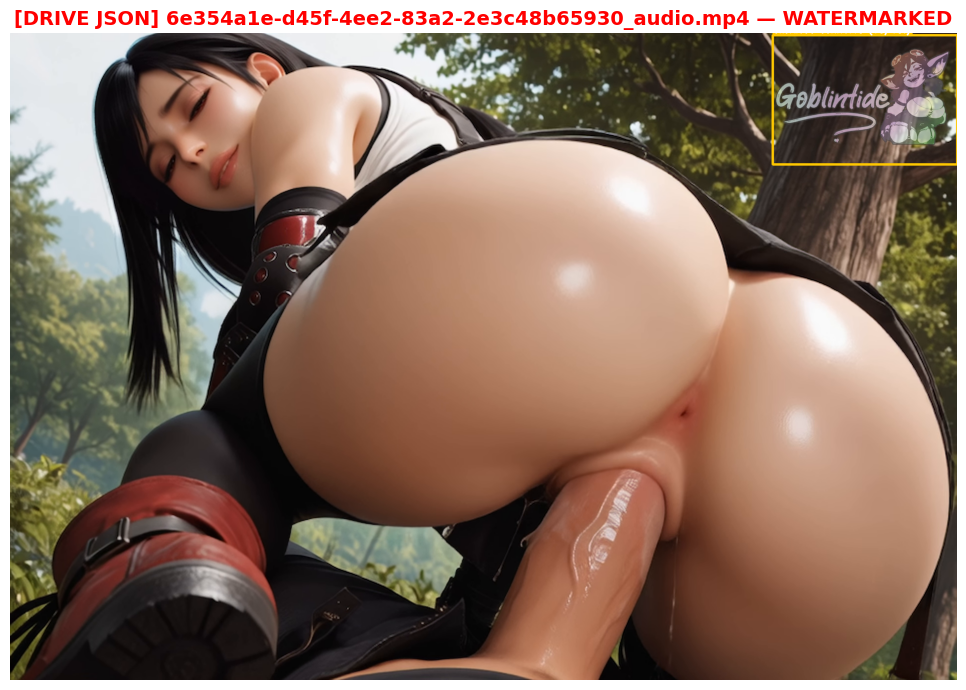

9c15e55a-6f1f-4e83-b190-e46ff9c19a67_audio_audio.mp4: WATERMARKED (2 bolge)


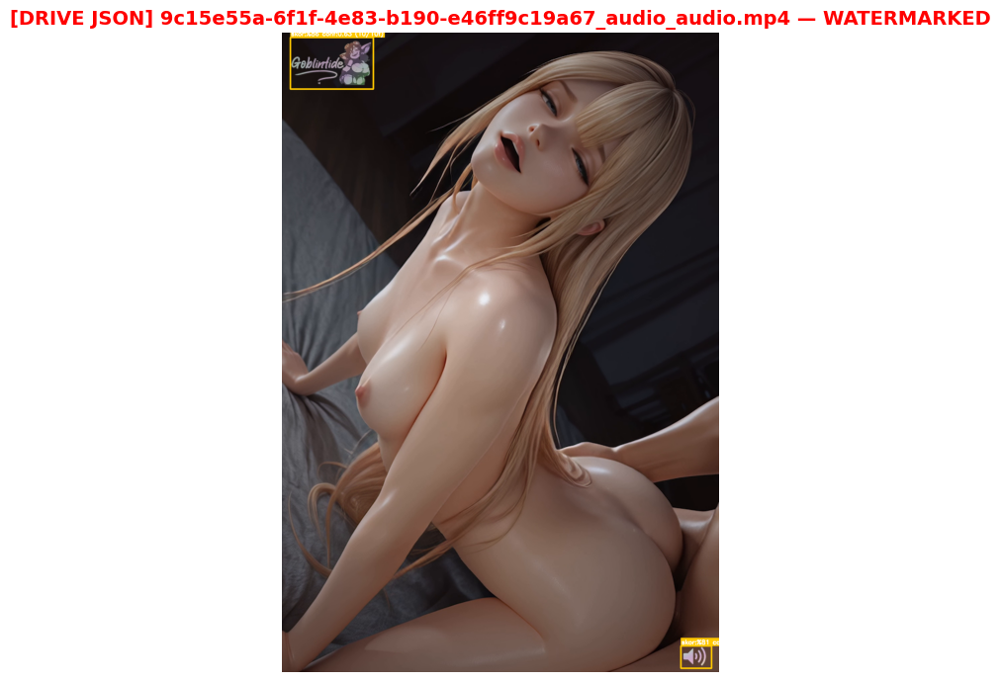

a8863b55-a03b-4ebd-b76f-6374b5e0faaa_audio.mp4: WATERMARKED (2 bolge)


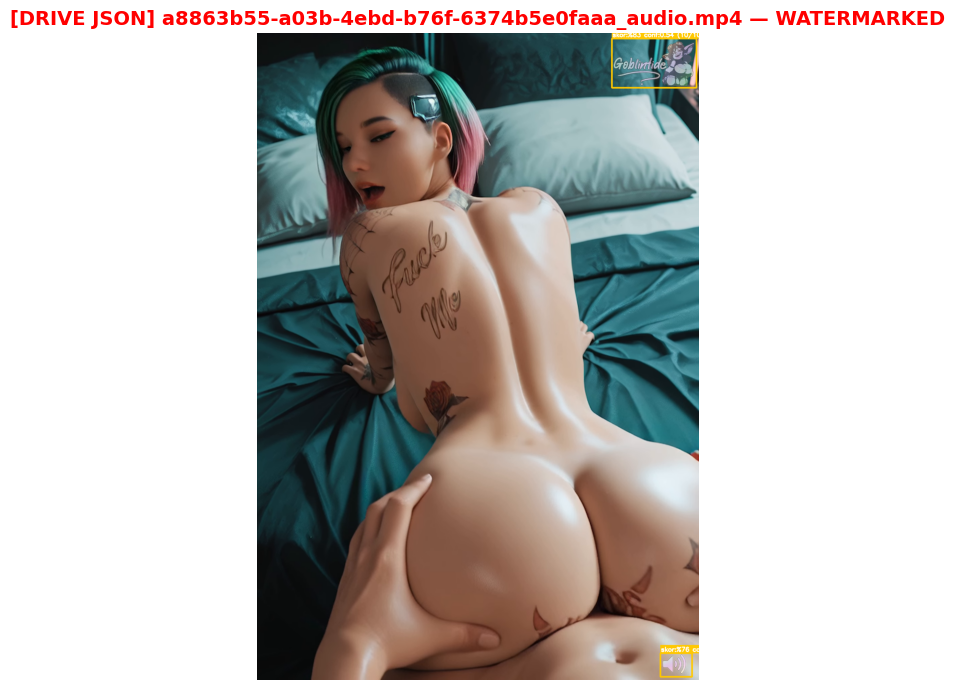

add383bc-c101-4ca5-898d-29fd41873cd1_audio_audio.mp4: WATERMARKED (2 bolge)


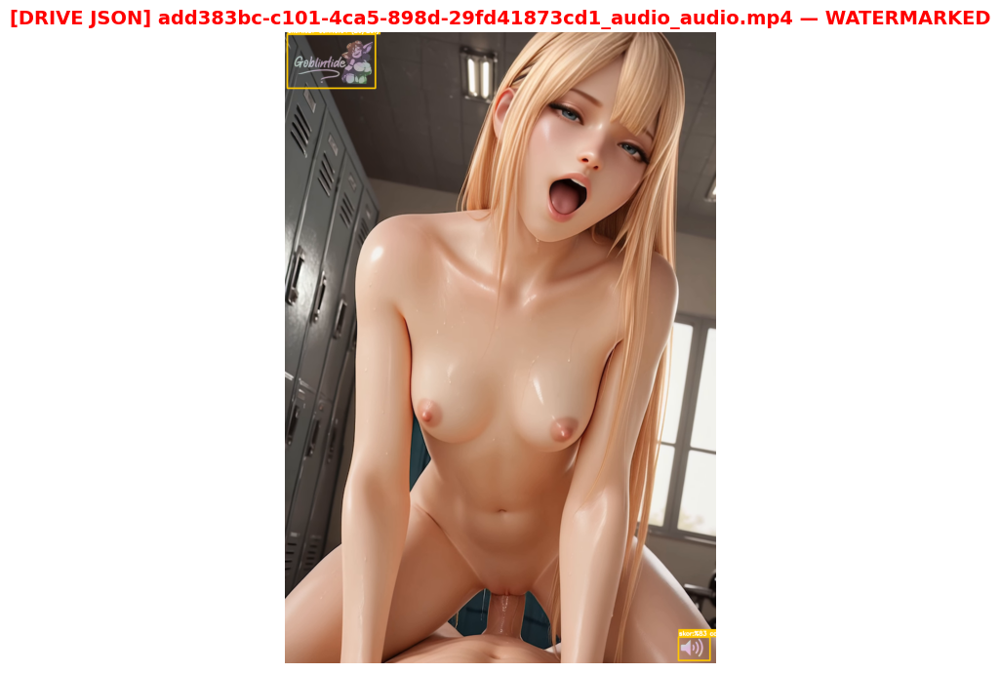

e25b4a39-b5a9-4a70-91fc-30e6969a14ae_audio.mp4: WATERMARKED (2 bolge)


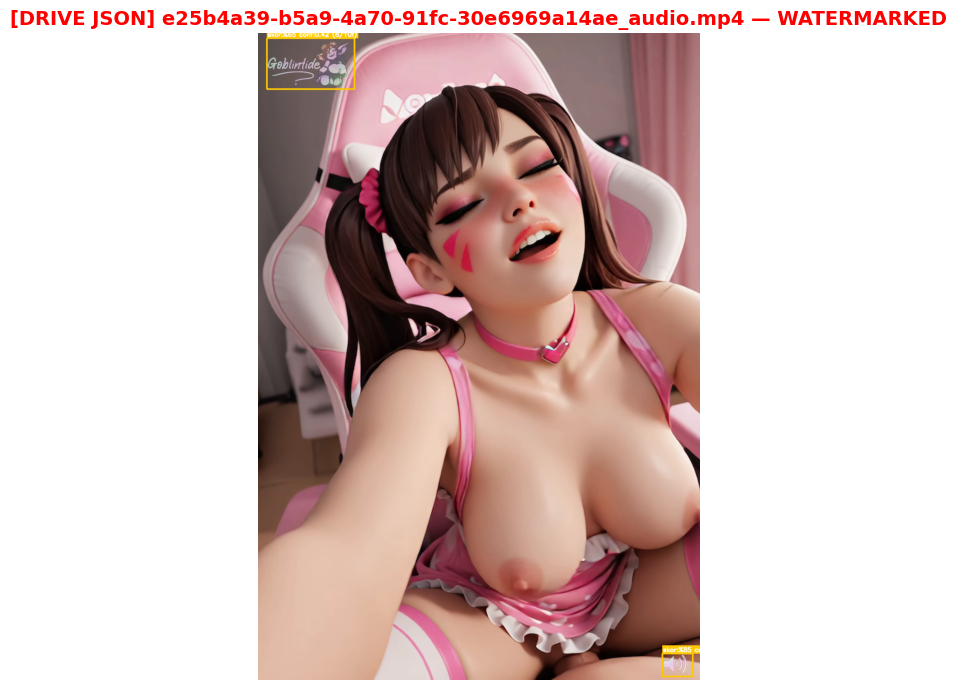

eaff0510-c67e-4953-a37b-5bc3f8e3db64_audio.mp4: WATERMARKED (2 bolge)


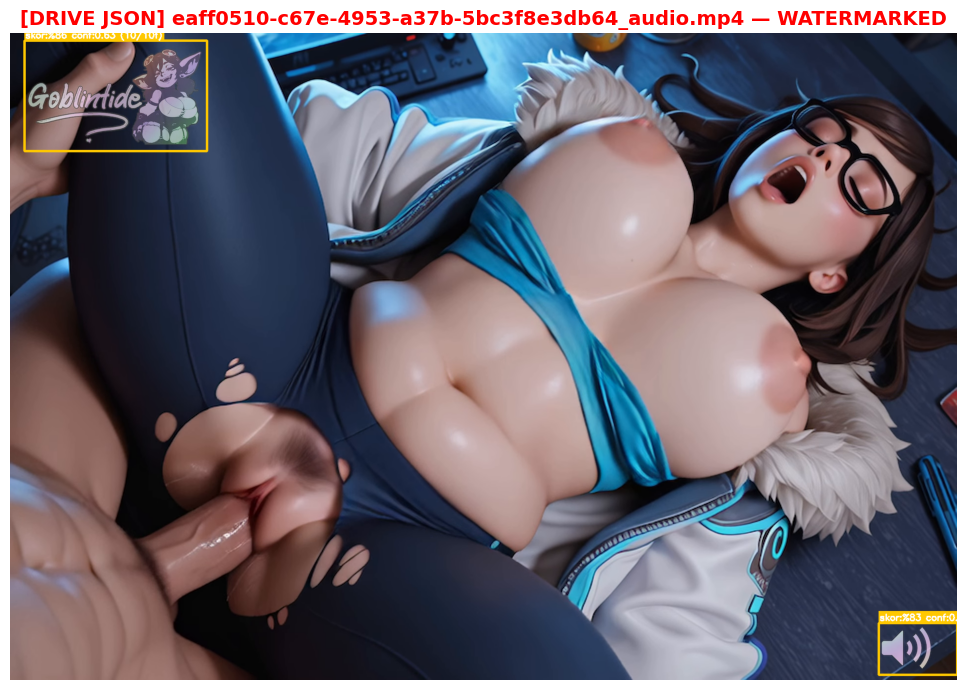

f7741182-66a2-4d5b-9ffe-2b906009afba_audio_audio.mp4: WATERMARKED (2 bolge)


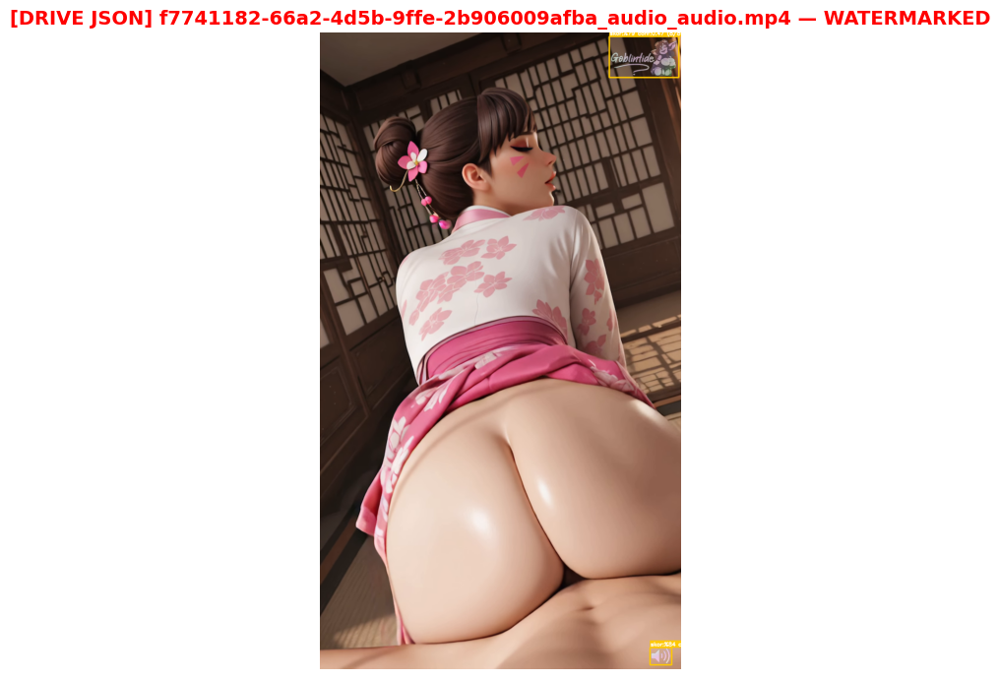

f7c039e7-afe8-41ab-b29a-5683517d5472_audio_audio.mp4: WATERMARKED (2 bolge)


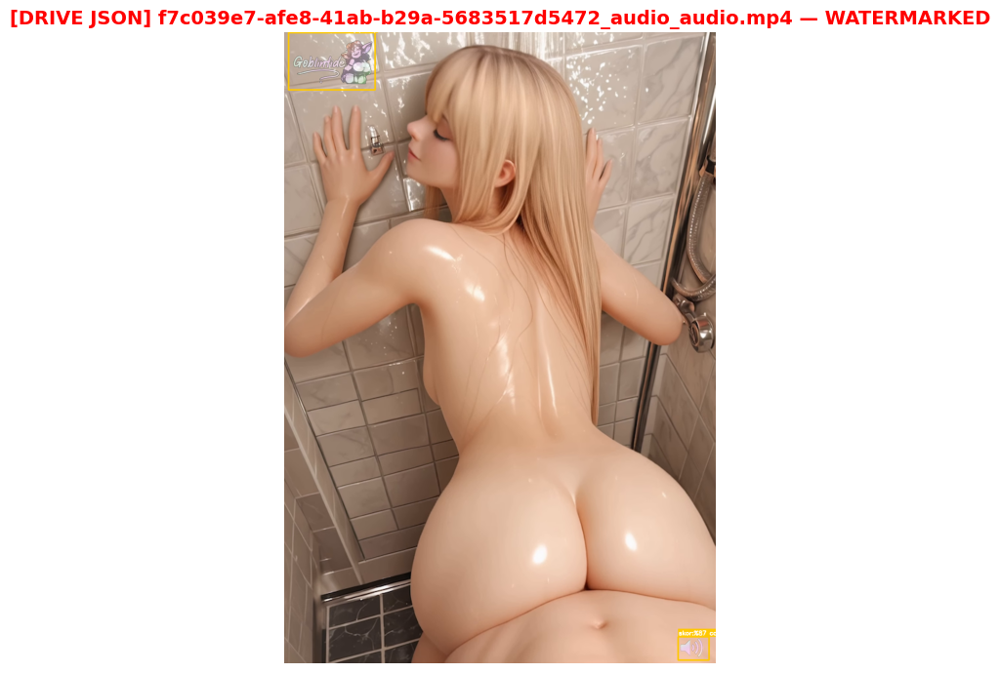


Dogrulama tamamlandi. Threshold: >=%10
JSON formatı dogru, source_path'ler calisiyor, bbox'lar cizildi.


In [11]:
# ============================================================
# DRIVE'DAN OKU — sadece Config hucresi calistirilmis olmali
# Detection sonuclarina bagli DEGIL, JSON'dan okuyor.
# ============================================================

import json, cv2, os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Drive mount kontrolu
if not os.path.ismount("/content/drive"):
    from google.colab import drive
    drive.mount("/content/drive")

_JSON_PATH = Path(OUTPUT_FOLDER) / "results.json"

with open(_JSON_PATH, "r", encoding="utf-8") as f:
    _data = json.load(f)

print(f"JSON okundu  : {_JSON_PATH}")
print(f"Input folder : {_data['config']['input_folder']}")
print(f"Config       : {_data['config']}")
print(f"Video sayisi : {len(_data['videos'])}")
print()

_threshold = _data["config"]["final_threshold"]

for rel_key, vinfo in _data["videos"].items():
    status  = vinfo["status"]
    regions = vinfo["regions"]
    source  = vinfo["source_path"]    # tam mutlak yol — dogrudan kullan

    print(f"{rel_key}: {status} ({len(regions)} bolge)")

    # Videodan orta frame'i cek
    cap = cv2.VideoCapture(source)
    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    cap.set(cv2.CAP_PROP_POS_FRAMES, total // 2)
    ret, frame = cap.read()
    cap.release()

    if not ret:
        print(f"  HATA: Frame okunamadi ({source})")
        continue

    # Bbox'lari ciz
    vis = frame.copy()
    for r in regions:
        x1, y1, x2, y2 = r["bbox"]
        score = r["score"]
        conf  = r["avg_conf"]
        fc    = r["frame_count"]
        tf    = r["total_frames"]
        cv2.rectangle(vis, (x1, y1), (x2, y2), (0, 200, 255), 3)
        txt = f"skor:%{int(score*100)} conf:{conf:.2f} ({fc}/{tf}f)"
        (lw, lh), _ = cv2.getTextSize(txt, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
        cv2.rectangle(vis, (x1, y1 - lh - 10), (x1 + lw + 4, y1), (0, 200, 255), -1)
        cv2.putText(vis, txt, (x1 + 2, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    # Goster
    fig, ax = plt.subplots(1, 1, figsize=(12, 7))
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    color = "red" if status == "WATERMARKED" else "green"
    ax.set_title(f"[DRIVE JSON] {rel_key} — {status}",
                 fontsize=14, fontweight="bold", color=color)
    ax.axis("off")
    plt.tight_layout()
    plt.show()
    plt.close(fig)

print(f"\nDogrulama tamamlandi. Threshold: >=%{int(_threshold*100)}")
print("JSON formati dogru, source_path'ler calisiyor, bbox'lar cizildi.")
